# DCGANs for MNIST dataset #

In [1]:
# Number of workers for training
num_workers = 4
# Batch size during training
batch_size = 512
# Spatial size of training images
image_size = 64
# Number of channels in the training images. For color images this is 3. For grayscale image (e.g. MNIST) is 1.
nc = 1
# Size of z latent vector (i.e. size of generator input)
nz = 100
# Size of feature maps in generator
ngf = 64
# Size of feature maps in discriminator
ndf = 64
# Number of training epochs
num_epochs = 20
# Learning rate for optimizers
lr = 0.0002
# Beta1 hyperparam for Adam optimizers
beta1 = 0.5
# Beta2 hyperparam for Adam optimizers
beta2 = 0.999

## Step1. Lightning data module for MNIST dataset ##

In [2]:
import os
import torch
from torch.utils.data import Dataset

from pytorch_lightning import LightningDataModule
from torch.utils.data import DataLoader, random_split
from torchvision.datasets import MNIST
from torchvision import transforms
from typing import Optional


class MNISTDataset(LightningDataModule):
    def __init__(
        self,
        data_path: str,
        batch_size: int = 128,
        num_workers: int = num_workers
        ):
        super().__init__()
        self.data_dir = data_path
        self.transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5), (0.5)), transforms.Resize(image_size)])
        self.batch_size = batch_size
        self.num_workers = num_workers

    def setup(self, stage: Optional[str] = None) -> None:
        if stage == 'fit' or stage is None:
            full_data = MNIST(os.getcwd(), train=True,  download=True, transform=self.transform)
            self.train_data, self.val_data = random_split(full_data, [50000, 10000])
        if stage == 'test' or stage is None:
            self.test_data  = MNIST(os.getcwd(), train=False, download=True, transform=self.transform)

    def train_dataloader(self):
        return DataLoader(self.train_data, batch_size=self.batch_size, num_workers=self.num_workers)

    def val_dataloader(self):
        return DataLoader(self.val_data, batch_size=self.batch_size, num_workers=self.num_workers)

    def test_dataloader(self):
        return DataLoader(self.test_data, batch_size=self.batch_size, num_workers=self.num_workers)        
    

## Step2. Generator and Discriminator ##

### Generator ###

In [3]:
from torch import nn

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.conv_transporse1 = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(inplace=True),
        )
        self.conv_transporse2 = nn.Sequential(
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(inplace=True),
        )
        self.conv_transporse3 = nn.Sequential(
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(inplace=True)
        )
        self.conv_transporse4 = nn.Sequential(
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(inplace=True)
        )
        self.conv_transporse5 = nn.Sequential(
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.conv_transporse1(x)
        x = self.conv_transporse2(x)
        x = self.conv_transporse3(x)
        x = self.conv_transporse4(x)
        x = self.conv_transporse5(x)

        return x

### Discriminator ###

In [4]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.fc_layer = nn.Sequential(
            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.fc_layer(x)
        return x

## Step3. DCGANs ##

In [5]:
from torch.nn import functional as F
from torch import optim
from torch import Tensor
#from torchmetrics.classification import Accuracy
from pytorch_lightning import LightningModule
from torchvision.utils import make_grid

class DCGANs(LightningModule):
    def __init__(
        self,
        #channels,
        #width,
        #height,
        latent_dim: int = nz,
        lr: float = lr,
        b1: float = beta1,
        b2: float = beta2,
        batch_size : int = 128,
        **kwargs
    ):
        super().__init__()
        self.save_hyperparameters()
        self.generator = Generator()
        self.discriminator = Discriminator()

        self.validation_z = torch.randn(64, self.hparams.latent_dim, 1, 1)
        self.example_input_array = torch.zeros(2, self.hparams.latent_dim, 1, 1)
        self.generated_images = {}
        self.generated_images_grid = {}

    def forward(self, z):
        return self.generator(z)

    def cross_entropy(self, x, y):
        return F.binary_cross_entropy(x, y)        
    
    def training_step(self, batch, batch_size, optimizer_idx):
        images, _ =  batch
        z = torch.randn(images.shape[0], self.hparams.latent_dim, 1, 1)
        z = z.type_as(images)

        # training the generator
        if optimizer_idx == 0:
            val = torch.ones(images.shape[0], 1)
            val = val.type_as(images)
            logits_G = self.discriminator(self(z)).view(-1,1)
            loss_G = self.cross_entropy(logits_G, val)

            log = {'train_loss_G': loss_G}
            return {'loss': loss_G, 'logs': log}

        # training the discriminator
        if optimizer_idx == 1:
            val = torch.ones(images.shape[0], 1)
            val = val.type_as(images)
            logits_real = self.discriminator(images).view(-1,1)
            loss_real = self.cross_entropy(logits_real, val)

            fake = torch.zeros(images.shape[0], 1)
            fake = fake.type_as(images)
            logits_fake = self.discriminator(self(z).detach()).view(-1,1)
            loss_fake = self.cross_entropy(logits_fake, fake)
            loss_D = (loss_real + loss_fake)/2.0

            log = {'train_loss_D': loss_D}
            return {'loss': loss_D, 'logs': log}

    def configure_optimizers(self):
        lr = self.hparams.lr
        b1 = self.hparams.b1
        b2 = self.hparams.b2
        
        opt_G = torch.optim.Adam(self.generator.parameters(), lr=lr, betas=(b1,b2))
        opt_D = torch.optim.Adam(self.discriminator.parameters(), lr=lr, betas=(b1,b2))

        return [opt_G, opt_D], []

    def training_epoch_end(self, outputs) -> None:
        avg_loss_G = torch.stack( tuple(x[0]['loss'] for x in outputs) ).mean()
        avg_loss_D = torch.stack( tuple(x[1]['loss'] for x in outputs) ).mean()
        print('epoch:', self.current_epoch, 'loss_G:', avg_loss_G, 'loss_D:', avg_loss_D)
        self.log('loss_G', {'train': avg_loss_G}) 
        self.log('loss_D', {'train': avg_loss_D})

        z = self.validation_z.to(self.device)
        sample_images = self(z)
        grid = make_grid(sample_images, nrow=8)
        self.logger.experiment.add_image('generated images', grid, self.current_epoch)
        self.generated_images[self.current_epoch] = sample_images
        self.generated_images_grid[self.current_epoch] = grid

## Step4. Logger ##

In [6]:
from pytorch_lightning.loggers import TensorBoardLogger

logger = TensorBoardLogger(save_dir='./tb_logs/', name = 'DCGANs')


%reload_ext tensorboard
%tensorboard --logdir=./tb_logs/

Reusing TensorBoard on port 6006 (pid 29098), started 2:10:06 ago. (Use '!kill 29098' to kill it.)

## Step5. Build & fit model ##

In [7]:
data = MNISTDataset(data_path = './', batch_size=batch_size)
model = DCGANs()

In [8]:
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks.progress import TQDMProgressBar

runner = Trainer(max_epochs=num_epochs,
                 gpus=[0],
                 accelerator='gpu',  # or 'gpu', 'auto'
                 logger=logger, 
                 callbacks=[TQDMProgressBar(refresh_rate=10)])


runner.fit(model, data)

/vols/solid/dev_ubdt/local/pyenv/versions/3.8.6/lib/python3.8/site-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:446: LightningDeprecationWarning: Setting `Trainer(gpus=[0])` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=[0])` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/vols/solid/dev_ubdt/local/pyenv/versions/3.8.6/lib/python3.8/site-packages/pytorch_lightning/trainer/configuration_validator.py:106: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
Missing logger folder: ./tb_logs/DCGANs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params | In sizes       | Out sizes     
-----------------

Training: 0it [00:00, ?it/s]

epoch: 0 loss_G: tensor(6.8259, device='cuda:0') loss_D: tensor(0.0394, device='cuda:0')
epoch: 1 loss_G: tensor(8.9338, device='cuda:0') loss_D: tensor(0.1368, device='cuda:0')
epoch: 2 loss_G: tensor(7.9213, device='cuda:0') loss_D: tensor(0.0142, device='cuda:0')
epoch: 3 loss_G: tensor(6.9655, device='cuda:0') loss_D: tensor(0.0017, device='cuda:0')
epoch: 4 loss_G: tensor(7.4609, device='cuda:0') loss_D: tensor(0.0007, device='cuda:0')
epoch: 5 loss_G: tensor(7.6879, device='cuda:0') loss_D: tensor(0.0006, device='cuda:0')
epoch: 6 loss_G: tensor(8.0534, device='cuda:0') loss_D: tensor(0.0003, device='cuda:0')
epoch: 7 loss_G: tensor(8.3691, device='cuda:0') loss_D: tensor(0.0002, device='cuda:0')
epoch: 8 loss_G: tensor(8.7676, device='cuda:0') loss_D: tensor(0.0001, device='cuda:0')
epoch: 9 loss_G: tensor(8.8025, device='cuda:0') loss_D: tensor(0.0001, device='cuda:0')
epoch: 10 loss_G: tensor(8.4376, device='cuda:0') loss_D: tensor(0.1450, device='cuda:0')
epoch: 11 loss_G: te

`Trainer.fit` stopped: `max_epochs=20` reached.


## Step6. Check fake images ##

(20, 530, 530)



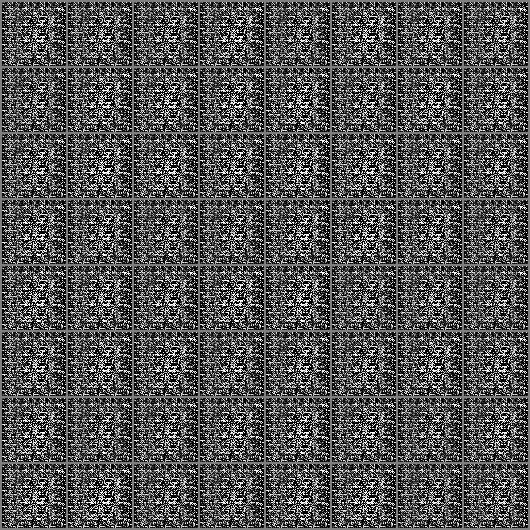
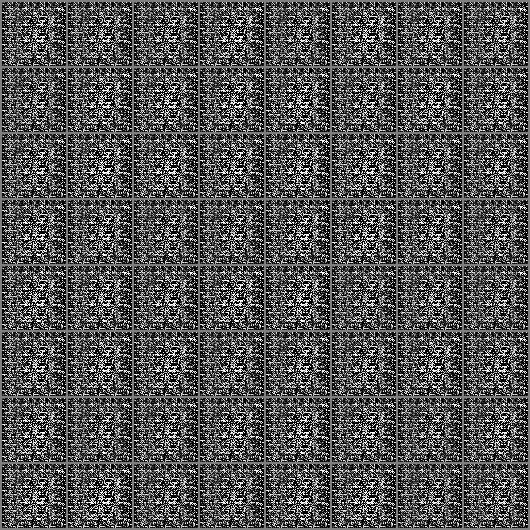
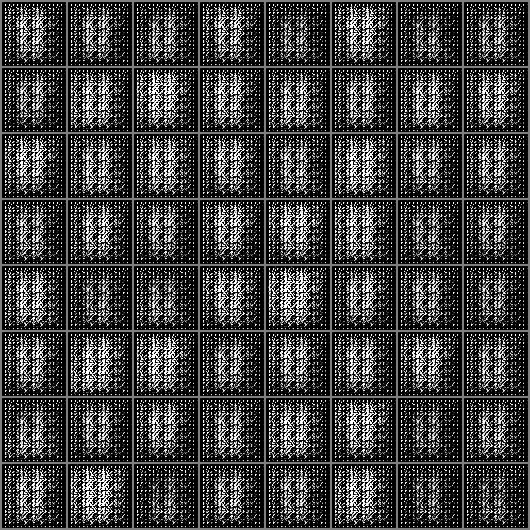
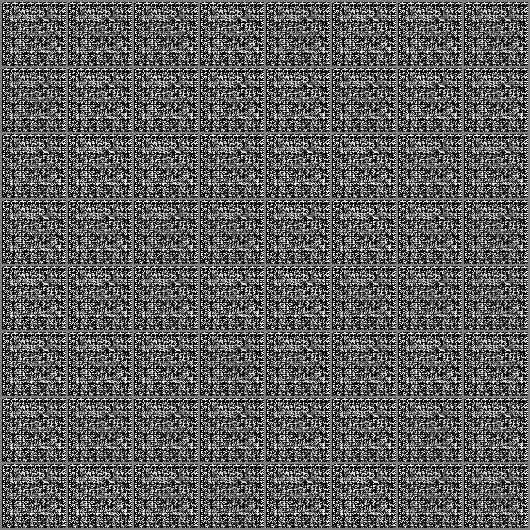
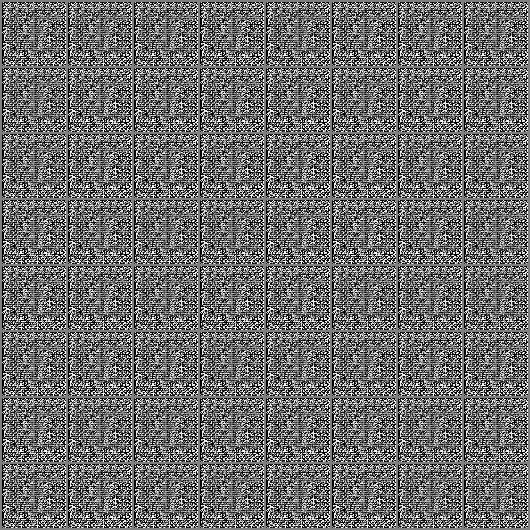
...
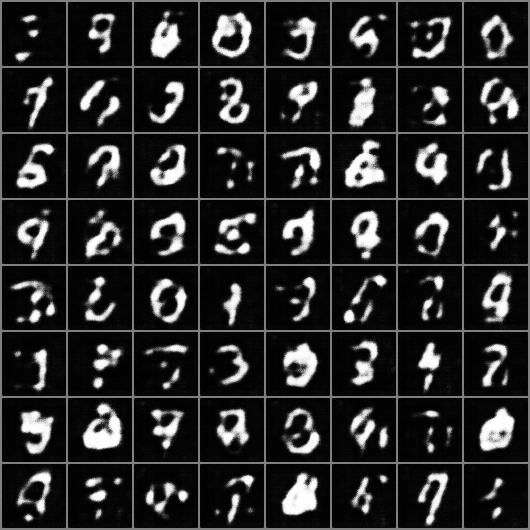
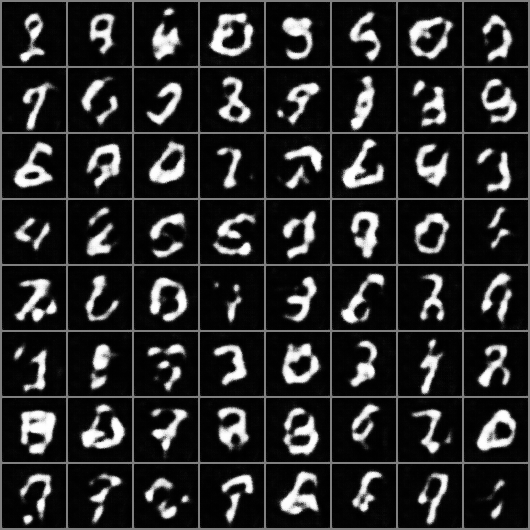
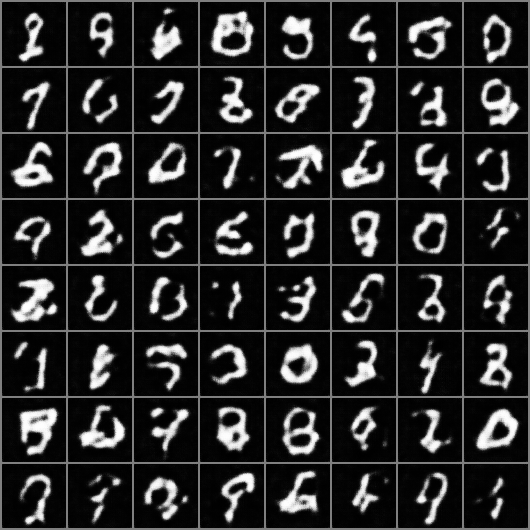
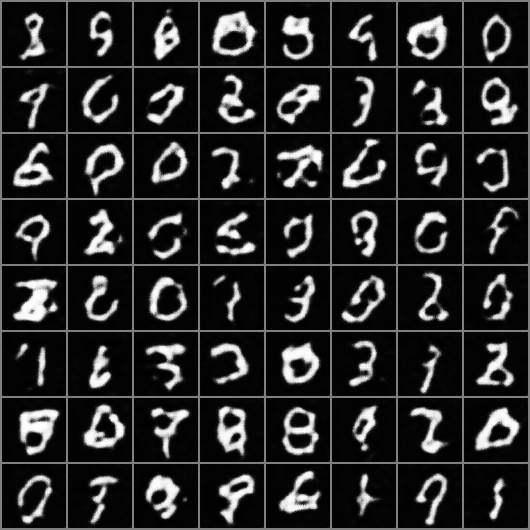
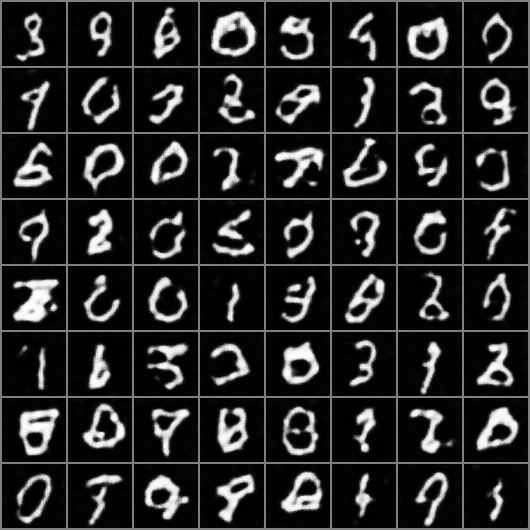

In [9]:
import numpy as np
import plotly.express as px

fake_images_grid = model.generated_images_grid

imgs = np.array([fake_images_grid[i][0].to(torch.device('cpu')).numpy() for i in fake_images_grid])
print(imgs.shape)

fig = px.imshow(imgs, animation_frame=0, binary_string=True)
fig.update_layout(
    autosize=False, 
    width=600, 
    height=800,
    sliders=[{
    "currentvalue": {
        "font": {"size": 14},
        "prefix": "Epoch:",
        "visible": True,
        "xanchor": "left"
    }
    }])

fig.show()
